# **PROJET 2 : Analyser des données de systèmes éducatifs**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')
import seaborn as sns
from pandas_profiling import ProfileReport
import missingno as msno
%matplotlib inline

## 1. Analyse des fichiers

### 1.1. *Premier fichier*

In [2]:
df1= pd.read_csv('EdStatsCountry-Series.csv')

In [3]:
# Pandas-profiling va nous permettre d'obtenir une première synthèse rapide de nos données
profile1 = ProfileReport(df1, title="Profiling df1")
profile1.to_notebook_iframe()

In [4]:
print("Nombre de lignes :{}".format(df1.shape[0]))
print("Nombre de Colonnes :{}".format(df1.shape[1]))

# Nombre de NaN dans l'ensemble du DataFrame
count_nan_df1 =df1.isna().sum().sum()
print ('Nombre de NaN dans df1: ' + str(count_nan_df1))

count_nan_colonneUnnamed =df1['Unnamed: 3'].isna().sum()
print ("Nombre de NaN dans la colonne 'Unnamed: 3': " + str(count_nan_df1))

Nombre de lignes :613
Nombre de Colonnes :4
Nombre de NaN dans df1: 613
Nombre de NaN dans la colonne 'Unnamed: 3': 613


In [5]:
# Suppression de la colonne 'Unnamed: 3'
df1=df1.drop('Unnamed: 3', axis=1)

In [6]:
# Nombre de code pays différents
print("Nombre de code pays :{}".format(len(df1.CountryCode.unique())))

Nombre de code pays :211


In [7]:
df1.head()

,CountryCode,SeriesCode,DESCRIPTION
0,ABW,SP.POP.TOTL,Data sources : United Nations World Population...
1,ABW,SP.POP.GROW,Data sources: United Nations World Population ...
2,AFG,SP.POP.GROW,Data sources: United Nations World Population ...
3,AFG,NY.GDP.PCAP.PP.CD,Estimates are based on regression.
4,AFG,SP.POP.TOTL,Data sources : United Nations World Population...


In [8]:
# Examinons les différentes informations dans la colonne "DESCRIPTION"
df1['DESCRIPTION'].unique()

array(['Data sources : United Nations World Population Prospects',
       'Data sources: United Nations World Population Prospects',
       'Estimates are based on regression.',
       'Data sources : Institute of Statistics, Eurostat',
       'Data sources : Australian Bureau of Statistics',
       'Including Other Territories comprising Jervis Bay Territory, Christmas Island and the Cocos (Keeling) Islands. ',
       'Data sources: Australian Bureau of Statistics',
       'Data sources : Eurostat',
       'Data sources : Eurostat, State Statistical Committee, United Nations World Population Prospects',
       'Data sources: Eurostat, State Statistical Committee, United Nations World Population Prospects',
       'Data sources : National Statistical Committee of the Republic of Belarus',
       'Data sources: National Statistical Committee of the Republic of Belarus',
       'Data sources : Bermuda Government Department of Statistics',
       'Data sources: Bermuda Government Departme

### 1.2.*Deuxième fichier*

In [9]:
df2 = pd.read_csv('EdStatsCountry.csv')

In [10]:
profile2 = ProfileReport(df2, title="Profiling df2")
profile2.to_notebook_iframe()

In [11]:
# Pourcentage de nan par colonne

column_with_nan = df2.columns[df2.isnull().any()]


for column in column_with_nan:
    print(column, df2[column].isnull().sum(), '-->',round((df2[column].isnull().sum()/df2.shape[0])*100,2),'% de nan')

2-alpha code 3 --> 1.24 % de nan
Currency Unit 26 --> 10.79 % de nan
Special Notes 96 --> 39.83 % de nan
Region 27 --> 11.2 % de nan
Income Group 27 --> 11.2 % de nan
WB-2 code 1 --> 0.41 % de nan
National accounts base year 36 --> 14.94 % de nan
National accounts reference year 209 --> 86.72 % de nan
SNA price valuation 44 --> 18.26 % de nan
Lending category 97 --> 40.25 % de nan
Other groups 183 --> 75.93 % de nan
System of National Accounts 26 --> 10.79 % de nan
Alternative conversion factor 194 --> 80.5 % de nan
PPP survey year 96 --> 39.83 % de nan
Balance of Payments Manual in use 60 --> 24.9 % de nan
External debt Reporting status 117 --> 48.55 % de nan
System of trade 41 --> 17.01 % de nan
Government Accounting concept 80 --> 33.2 % de nan
IMF data dissemination standard 60 --> 24.9 % de nan
Latest population census 28 --> 11.62 % de nan
Latest household survey 100 --> 41.49 % de nan
Source of most recent Income and expenditure data 81 --> 33.61 % de nan
Vital registration comp

In [12]:
# Structure du Dataframe
print("Nombre de lignes :{}".format(df2.shape[0]))
print("Nombre de Colonnes :{}".format(df2.shape[1]))

# Nombre de NaN dans l'ensemble du DataFrame
count_nan_df2 =df2.isna().sum().sum()
print ('Nombre de NaN dans df2: ' + str(count_nan_df2))


Nombre de lignes :241
Nombre de Colonnes :32
Nombre de NaN dans df2: 2354


In [13]:
df2.head()

,Country Code,Short Name,Table Name,Long Name,2-alpha code,Currency Unit,Special Notes,Region,Income Group,WB-2 code,...,IMF data dissemination standard,Latest population census,Latest household survey,Source of most recent Income and expenditure data,Vital registration complete,Latest agricultural census,Latest industrial data,Latest trade data,Latest water withdrawal data,Unnamed: 31
0,ABW,Aruba,Aruba,Aruba,AW,Aruban florin,SNA data for 2000-2011 are updated from offici...,Latin America & Caribbean,High income: nonOECD,AW,...,NaN,2010,NaN,NaN,Yes,NaN,NaN,2012.0,NaN,NaN
1,AFG,Afghanistan,Afghanistan,Islamic State of Afghanistan,AF,Afghan afghani,Fiscal year end: March 20; reporting period fo...,South Asia,Low income,AF,...,General Data Dissemination System (GDDS),1979,"Multiple Indicator Cluster Survey (MICS), 2010/11","Integrated household survey (IHS), 2008",NaN,2013/14,NaN,2012.0,2000,NaN
2,AGO,Angola,Angola,People's Republic of Angola,AO,Angolan kwanza,"April 2013 database update: Based on IMF data,...",Sub-Saharan Africa,Upper middle income,AO,...,General Data Dissemination System (GDDS),1970,"Malaria Indicator Survey (MIS), 2011","Integrated household survey (IHS), 2008",NaN,2015,NaN,NaN,2005,NaN
3,ALB,Albania,Albania,Republic of Albania,AL,Albanian lek,NaN,Europe & Central Asia,Upper middle income,AL,...,General Data Dissemination System (GDDS),2011,"Demographic and Health Survey (DHS), 2008/09",Living Standards Measurement Study Survey (LSM...,Yes,2012,2010.0,2012.0,2006,NaN
4,AND,Andorra,Andorra,Principality of Andorra,AD,Euro,NaN,Europe & Central Asia,High income: nonOECD,AD,...,NaN,2011. Population figures compiled from adminis...,NaN,NaN,Yes,NaN,NaN,2006.0,NaN,NaN


#### *Suppression des variables qui n'ont pas d'intérêt pour notre mission*

In [14]:
Colonnes_A_Supprimer = ['Table Name','Long Name','2-alpha code','Currency Unit','Special Notes','WB-2 code','National accounts base year','National accounts reference year','SNA price valuation',
                       'Lending category','Other groups','System of National Accounts', 'Alternative conversion factor','PPP survey year','Balance of Payments Manual in use', 'External debt Reporting status',
                       'System of trade','Government Accounting concept','IMF data dissemination standard','Latest population census','Latest household survey','Source of most recent Income and expenditure data',
                       'Vital registration complete','Latest agricultural census','Latest industrial data', 'Latest trade data','Latest water withdrawal data','Unnamed: 31']
df2 = df2.drop(Colonnes_A_Supprimer,axis=1)

In [15]:
df2.head()

,Country Code,Short Name,Region,Income Group
0,ABW,Aruba,Latin America & Caribbean,High income: nonOECD
1,AFG,Afghanistan,South Asia,Low income
2,AGO,Angola,Sub-Saharan Africa,Upper middle income
3,ALB,Albania,Europe & Central Asia,Upper middle income
4,AND,Andorra,Europe & Central Asia,High income: nonOECD


In [16]:
# Nombre de nan dans df2
df2.isna().sum().sum()

54

In [17]:
# Visualisation des valeurs observations comportant des valeurs manquantes
df2[df2['Income Group'].isna()]

,Country Code,Short Name,Region,Income Group
5,ARB,Arab World,NaN,NaN
57,EAP,East Asia & Pacific (developing only),NaN,NaN
58,EAS,East Asia & Pacific (all income levels),NaN,NaN
59,ECA,Europe & Central Asia (developing only),NaN,NaN
60,ECS,Europe & Central Asia (all income levels),NaN,NaN
63,EMU,Euro area,NaN,NaN
68,EUU,European Union,NaN,NaN
78,GIB,Gibraltar,NaN,NaN
89,HIC,High income,NaN,NaN
92,HPC,Heavily indebted poor countries (HIPC),NaN,NaN


#### *Suppression des nan*

In [18]:
df2=df2.dropna()

In [19]:
# Vérification
print(f"Nombre de nan dans df2 : {df2.isna().sum()}")

Nombre de nan dans df2 : Country Code    0
Short Name      0
Region          0
Income Group    0
dtype: int64


### 1.3.*Troisième fichier*

In [20]:
df3=pd.read_csv('EdStatsData.csv')

In [21]:
profile3 = ProfileReport(df3, title="Profiling df3",minimal=True)
profile3.to_notebook_iframe()

In [22]:
df3.describe(include='O')

,Country Name,Country Code,Indicator Name,Indicator Code
count,886930,886930,886930,886930
unique,242,242,3665,3665
top,American Samoa,IMN,LLECE: Distribution of 3rd Grade Mathematics S...,SABER.SCH.ATNM.GOAL4.LVL3
freq,3665,3665,242,242


In [23]:
# Structure du Dataframe
print("Nombre de lignes :{}".format(df3.shape[0]))
print("Nombre de Colonnes :{}".format(df3.shape[1]))

# Nombre de NaN dans l'ensemble du DataFrame
count_nan_df3 =df3.isna().sum().sum()
print ('Nombre de NaN dans df3: ' + str(count_nan_df3))

Nombre de lignes :886930
Nombre de Colonnes :70
Nombre de NaN dans df3: 53455179


In [24]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 886930 entries, 0 to 886929
Data columns (total 70 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Country Name    886930 non-null  object 
 1   Country Code    886930 non-null  object 
 2   Indicator Name  886930 non-null  object 
 3   Indicator Code  886930 non-null  object 
 4   1970            72288 non-null   float64
 5   1971            35537 non-null   float64
 6   1972            35619 non-null   float64
 7   1973            35545 non-null   float64
 8   1974            35730 non-null   float64
 9   1975            87306 non-null   float64
 10  1976            37483 non-null   float64
 11  1977            37574 non-null   float64
 12  1978            37576 non-null   float64
 13  1979            36809 non-null   float64
 14  1980            89122 non-null   float64
 15  1981            38777 non-null   float64
 16  1982            37511 non-null   float64
 17  1983      

In [25]:
# Suppression des observations dont toutes les cellules sont NA
df3= df3.dropna(how='all')

# Suppresion des colonnes dont toutes les valeurs sont manquantes
df3 = df3.dropna(axis=1, how='all')

In [26]:
# Différents type d'indicateurs
df3['Indicator Name'].unique()

array(['Adjusted net enrolment rate, lower secondary, both sexes (%)',
       'Adjusted net enrolment rate, lower secondary, female (%)',
       'Adjusted net enrolment rate, lower secondary, gender parity index (GPI)',
       ..., 'Youth literacy rate, population 15-24 years, female (%)',
       'Youth literacy rate, population 15-24 years, gender parity index (GPI)',
       'Youth literacy rate, population 15-24 years, male (%)'],
      dtype=object)

In [27]:
print("Nombre d\'indicateurs :{}".format(len(df3['Indicator Name'].unique())))

Nombre d'indicateurs :3665


In [28]:
# Nombre et Pourcentage de nan par colonne
column_with_nan = df3.columns[df3.isnull().any()]


for column in column_with_nan:
    print(column, df3[column].isnull().sum(), '-->',round((df3[column].isnull().sum()/df3.shape[0])*100,2),'% de nan')

1970 814642 --> 91.85 % de nan
1971 851393 --> 95.99 % de nan
1972 851311 --> 95.98 % de nan
1973 851385 --> 95.99 % de nan
1974 851200 --> 95.97 % de nan
1975 799624 --> 90.16 % de nan
1976 849447 --> 95.77 % de nan
1977 849356 --> 95.76 % de nan
1978 849354 --> 95.76 % de nan
1979 850121 --> 95.85 % de nan
1980 797808 --> 89.95 % de nan
1981 848153 --> 95.63 % de nan
1982 849419 --> 95.77 % de nan
1983 848470 --> 95.66 % de nan
1984 848324 --> 95.65 % de nan
1985 796634 --> 89.82 % de nan
1986 847558 --> 95.56 % de nan
1987 848289 --> 95.64 % de nan
1988 848378 --> 95.65 % de nan
1989 849390 --> 95.77 % de nan
1990 762525 --> 85.97 % de nan
1991 812493 --> 91.61 % de nan
1992 811387 --> 91.48 % de nan
1993 811137 --> 91.45 % de nan
1994 809468 --> 91.27 % de nan
1995 755569 --> 85.19 % de nan
1996 810123 --> 91.34 % de nan
1997 813477 --> 91.72 % de nan
1998 802016 --> 90.43 % de nan
1999 768091 --> 86.6 % de nan
2000 710254 --> 80.08 % de nan
2001 763421 --> 86.07 % de nan
2002 7627

### 1.4.*Quatrième fichier*

In [29]:
df4=pd.read_csv('EdStatsFootNote.csv')

In [30]:
profile4 = ProfileReport(df4, title="Profiling df4",minimal=True)
profile4.to_notebook_iframe()

In [31]:
print("Nombre de lignes :{}".format(df4.shape[0]))
print("Nombre de Colonnes :{}".format(df4.shape[1]))
print("Nombre de nan dans df4 :{}".format(df4.isna().sum().sum()))

Nombre de lignes :643638
Nombre de Colonnes :5
Nombre de nan dans df4 :643638


In [32]:
df4.head()

,CountryCode,SeriesCode,Year,DESCRIPTION,Unnamed: 4
0,ABW,SE.PRE.ENRL.FE,YR2001,Country estimation.,NaN
1,ABW,SE.TER.TCHR.FE,YR2005,Country estimation.,NaN
2,ABW,SE.PRE.TCHR.FE,YR2000,Country estimation.,NaN
3,ABW,SE.SEC.ENRL.GC,YR2004,Country estimation.,NaN
4,ABW,SE.PRE.TCHR,YR2006,Country estimation.,NaN


In [33]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 643638 entries, 0 to 643637
Data columns (total 5 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   CountryCode  643638 non-null  object 
 1   SeriesCode   643638 non-null  object 
 2   Year         643638 non-null  object 
 3   DESCRIPTION  643638 non-null  object 
 4   Unnamed: 4   0 non-null       float64
dtypes: float64(1), object(4)
memory usage: 24.6+ MB


In [34]:
# Vérification des différentes informations contenues dans la colonne "DESCRIPTION"
df4['DESCRIPTION'].unique()

array(['Country estimation.', 'UIS Estimation',
       'UNESCO Institute for Statistics (UIS) estimate', ...,
       'Uncertainty bound is 91.6 - 109.3',
       'Uncertainty bound is 54.3 - 76',
       'Uncertainty bound is 48.3 - 73.3'], dtype=object)

### 1.5.*Cinquième fichier*

In [35]:
df5=pd.read_csv('EdStatsSeries.csv')

In [36]:
profile5 = ProfileReport(df5, title="Profiling df5",minimal=True)
profile5.to_notebook_iframe()

In [37]:
# Structure du Dataframe
print("Nombre de lignes :{}".format(df5.shape[0]))
print("Nombre de Colonnes :{}".format(df5.shape[1]))
print("Nombre de nan dans df5 :{}".format(df5.isna().sum().sum()))

Nombre de lignes :3665
Nombre de Colonnes :21
Nombre de nan dans df5 :55203


In [38]:
df5.head(3)

,Series Code,Topic,Indicator Name,Short definition,Long definition,Unit of measure,Periodicity,Base Period,Other notes,Aggregation method,...,Notes from original source,General comments,Source,Statistical concept and methodology,Development relevance,Related source links,Other web links,Related indicators,License Type,Unnamed: 20
0,BAR.NOED.1519.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 15-19 with...,Percentage of female population age 15-19 with...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BAR.NOED.1519.ZS,Attainment,Barro-Lee: Percentage of population age 15-19 ...,Percentage of population age 15-19 with no edu...,Percentage of population age 15-19 with no edu...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,BAR.NOED.15UP.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 15+ with n...,Percentage of female population age 15+ with n...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [39]:
# Type de variables et nombre d'observations non nulles
df5.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3665 entries, 0 to 3664
Data columns (total 21 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Series Code                          3665 non-null   object 
 1   Topic                                3665 non-null   object 
 2   Indicator Name                       3665 non-null   object 
 3   Short definition                     2156 non-null   object 
 4   Long definition                      3665 non-null   object 
 5   Unit of measure                      0 non-null      float64
 6   Periodicity                          99 non-null     object 
 7   Base Period                          314 non-null    object 
 8   Other notes                          552 non-null    object 
 9   Aggregation method                   47 non-null     object 
 10  Limitations and exceptions           14 non-null     object 
 11  Notes from original source    

In [40]:
# Examinons les différents type d'informations dans la colonne 'Indicator Name'
df5['Indicator Name'].unique()

array(['Barro-Lee: Percentage of female population age 15-19 with no education',
       'Barro-Lee: Percentage of population age 15-19 with no education',
       'Barro-Lee: Percentage of female population age 15+ with no education',
       ..., 'Government expenditure per tertiary student (constant US$)',
       'Government expenditure in secondary institutions education as % of GDP (%)',
       'Government expenditure in tertiary institutions as % of GDP (%)'],
      dtype=object)

In [41]:
df5.describe(include='O')

,Series Code,Topic,Indicator Name,Short definition,Long definition,Periodicity,Base Period,Other notes,Aggregation method,Limitations and exceptions,General comments,Source,Statistical concept and methodology,Development relevance,Related source links
count,3665,3665,3665,2156,3665,99,314,552,47,14,14,3665,23,3,215
unique,3665,37,3665,1169,2060,1,4,14,3,9,8,31,2,1,1
top,LO.TIMSS.SCI8.P10,Learning Outcomes,Internet users (per 100 people),Data Interpretation: 1=Latent; 2=Emerging; 3=E...,Data Interpretation: 1=Latent; 2=Emerging; 3=E...,Annual,Projections (2010 to 2100),EGRA,Weighted average,Data should be used cautiously because of diff...,When NEET rates are available for more than tw...,UNESCO Institute for Statistics,TIMSS,Unemployment and total employment are the broa...,http://saber.worldbank.org/index.cfm
freq,1,1046,1,215,215,99,308,403,31,3,3,1269,20,3,215


--> Le DataFrame df5 ne semble pas contenir d'information interessante pour notre mission (hormis la définition des indicateurs)

## 2. Préparation des données

### *2.1. Jointure des fichiers df2 & df3*

In [42]:
data_and_countryicome = pd.merge(df3,df2, how='inner', on='Country Code')

### *2.2. Filtrage des données via la séléction d'indicateurs pertinents pour notre mission*

#### 2.2.1 *Création du Dataframe "Tech_indicators"*

In [43]:
# 'IT.NET.USER.P2' : Internet users (per 100 people)
# 'IT.CMP.PCMP.P2' : Personal computers (per 100 people)
# L'objectif de ces deux indicateurs est de mesurer le taux d'équipement des habitants en connexion internet et en PC,

indicators_to_keep = ['IT.NET.USER.P2', 'IT.CMP.PCMP.P2']
Tech_Indicators = data_and_countryicome[data_and_countryicome['Indicator Code'].isin(indicators_to_keep)]

Tech_Indicators.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2070,2075,2080,2085,2090,2095,2100,Short Name,Region,Income Group
1375,Afghanistan,AFG,Internet users (per 100 people),IT.NET.USER.P2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Afghanistan,South Asia,Low income
2084,Afghanistan,AFG,Personal computers (per 100 people),IT.CMP.PCMP.P2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Afghanistan,South Asia,Low income
5040,Albania,ALB,Internet users (per 100 people),IT.NET.USER.P2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Albania,Europe & Central Asia,Upper middle income
5749,Albania,ALB,Personal computers (per 100 people),IT.CMP.PCMP.P2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Albania,Europe & Central Asia,Upper middle income
8705,Algeria,DZA,Internet users (per 100 people),IT.NET.USER.P2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Algeria,Middle East & North Africa,Upper middle income


In [44]:
Tech_Indicators.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 428 entries, 1375 to 782729
Data columns (total 72 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Country Name    428 non-null    object 
 1   Country Code    428 non-null    object 
 2   Indicator Name  428 non-null    object 
 3   Indicator Code  428 non-null    object 
 4   1970            8 non-null      float64
 5   1971            0 non-null      float64
 6   1972            0 non-null      float64
 7   1973            0 non-null      float64
 8   1974            0 non-null      float64
 9   1975            8 non-null      float64
 10  1976            8 non-null      float64
 11  1977            8 non-null      float64
 12  1978            8 non-null      float64
 13  1979            8 non-null      float64
 14  1980            9 non-null      float64
 15  1981            11 non-null     float64
 16  1982            10 non-null     float64
 17  1983            11 non-null  

In [45]:
# On peut observer que les données dans le dataframe Tech_indicators commencent à être bien renseignées à partir de 1990 et jusqu'en 2016
# Nous allons conserver que les 5 années les plus récentes

##### *2.2.1.1  Filtre sur Tech_indicators par date*

In [46]:
Tech_indicators_2012_2016 = Tech_Indicators.filter(items=['Country Name', 'Country Code','Region', 'Income Group', 'Indicator Name', 'Indicator Code', '2012', '2013', '2014','2015','2016'])

Tech_indicators_2012_2016.head()

,Country Name,Country Code,Region,Income Group,Indicator Name,Indicator Code,2012,2013,2014,2015,2016
1375,Afghanistan,AFG,South Asia,Low income,Internet users (per 100 people),IT.NET.USER.P2,5.454545,5.9,7.0,8.260000,10.595726
2084,Afghanistan,AFG,South Asia,Low income,Personal computers (per 100 people),IT.CMP.PCMP.P2,NaN,NaN,NaN,NaN,NaN
5040,Albania,ALB,Europe & Central Asia,Upper middle income,Internet users (per 100 people),IT.NET.USER.P2,54.655959,57.2,60.1,63.252933,66.363445
5749,Albania,ALB,Europe & Central Asia,Upper middle income,Personal computers (per 100 people),IT.CMP.PCMP.P2,NaN,NaN,NaN,NaN,NaN
8705,Algeria,DZA,Middle East & North Africa,Upper middle income,Internet users (per 100 people),IT.NET.USER.P2,18.200000,22.5,29.5,38.200000,42.945527


##### *2.2.1.2  Nettoyage de Tech_indicators*

In [47]:
# Suppression des lignes contenant moins de 7 valeurs non-manquantes.
Tech_indicators_2012_2016=Tech_indicators_2012_2016.dropna(thresh=7)

In [48]:
Tech_indicators_2012_2016.head()

,Country Name,Country Code,Region,Income Group,Indicator Name,Indicator Code,2012,2013,2014,2015,2016
1375,Afghanistan,AFG,South Asia,Low income,Internet users (per 100 people),IT.NET.USER.P2,5.454545,5.9,7.0,8.260000,10.595726
5040,Albania,ALB,Europe & Central Asia,Upper middle income,Internet users (per 100 people),IT.NET.USER.P2,54.655959,57.2,60.1,63.252933,66.363445
8705,Algeria,DZA,Middle East & North Africa,Upper middle income,Internet users (per 100 people),IT.NET.USER.P2,18.200000,22.5,29.5,38.200000,42.945527
16035,Andorra,AND,Europe & Central Asia,High income: nonOECD,Internet users (per 100 people),IT.NET.USER.P2,86.434425,94.0,95.9,96.910000,97.930637
19700,Angola,AGO,Sub-Saharan Africa,Upper middle income,Internet users (per 100 people),IT.NET.USER.P2,6.500000,8.9,10.2,12.400000,13.000000


In [49]:
Tech_indicators_2012_2016.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 202 entries, 1375 to 782020
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Country Name    202 non-null    object 
 1   Country Code    202 non-null    object 
 2   Region          202 non-null    object 
 3   Income Group    202 non-null    object 
 4   Indicator Name  202 non-null    object 
 5   Indicator Code  202 non-null    object 
 6   2012            201 non-null    float64
 7   2013            201 non-null    float64
 8   2014            201 non-null    float64
 9   2015            201 non-null    float64
 10  2016            200 non-null    float64
dtypes: float64(5), object(6)
memory usage: 18.9+ KB


In [50]:
print(f"il reste encore {Tech_indicators_2012_2016.isna().sum().sum()} valeurs manquantes")

il reste encore 6 valeurs manquantes


In [51]:
# Selection des lignes qui ont au moins une valeur manquante
Tech_indicators_2012_2016[Tech_indicators_2012_2016.isna().any(axis=1)]

,Country Name,Country Code,Region,Income Group,Indicator Name,Indicator Code,2012,2013,2014,2015,2016
367875,"Korea, Dem. People’s Rep.",PRK,East Asia & Pacific,Low income,Internet users (per 100 people),IT.NET.USER.P2,0.0,NaN,NaN,NaN,NaN
404525,Libya,LBY,Middle East & North Africa,Upper middle income,Internet users (per 100 people),IT.NET.USER.P2,NaN,16.5,17.76,19.016080,20.27216
503480,New Caledonia,NCL,East Asia & Pacific,High income: nonOECD,Internet users (per 100 people),IT.NET.USER.P2,58.0,66.0,70.00,74.001753,NaN


In [52]:
# Suppression des lignes qui contiennent des valeurs manquantes
Tech_indicators_2012_2016=Tech_indicators_2012_2016.dropna(how='any')

In [53]:
# Vérification : Les valeurs manquantes ont-elles bien été supprimées ?

print(f"Nombre totales de valeurs manquantes dans 'Tech_indicators_2012_2016' : {Tech_indicators_2012_2016.isna().sum().sum()}")

Nombre totales de valeurs manquantes dans 'Tech_indicators_2012_2016' : 0


#### *Remarque*

In [54]:
# il ne reste plus qu'un seul indicateur suite au nettoyage des données: Le nombre d'utilisateurs internet pour 100 habitants
Tech_indicators_2012_2016['Indicator Code'].unique()

array(['IT.NET.USER.P2'], dtype=object)

In [55]:
print("Il ne nous reste plus que {} pays suite à notre sélection".format(len(Tech_indicators_2012_2016['Country Code'].unique())))

Il ne nous reste plus que 199 pays suite à notre sélection


In [56]:
# Liste des pays restant en "course"
countries =Tech_indicators_2012_2016['Country Code'].unique()

In [57]:
countries = ['AFG', 'ALB', 'DZA', 'AND', 'AGO', 'ATG', 'ARG', 'ARM', 'ABW',
           'AUS', 'AUT', 'AZE', 'BHS', 'BHR', 'BGD', 'BRB', 'BLR', 'BEL',
           'BLZ', 'BEN', 'BMU', 'BTN', 'BOL', 'BIH', 'BWA', 'BRA', 'BRN',
            'BGR', 'BFA', 'BDI', 'CPV', 'KHM', 'CMR', 'CAN', 'CYM', 'CAF',
           'TCD', 'CHL', 'CHN', 'COL', 'COM', 'COD', 'COG', 'CRI', 'CIV',
           'HRV', 'CUB', 'CYP', 'CZE', 'DNK', 'DJI', 'DMA', 'DOM', 'ECU',
           'EGY', 'SLV', 'GNQ', 'ERI', 'EST', 'ETH', 'FRO', 'FJI', 'FIN',
           'FRA', 'PYF', 'GAB', 'GMB', 'GEO', 'DEU', 'GHA', 'GRC', 'GRL',
           'GRD', 'GUM', 'GTM', 'GIN', 'GNB', 'GUY', 'HTI', 'HND', 'HKG',
           'HUN', 'ISL', 'IND', 'IDN', 'IRN', 'IRQ', 'IRL', 'ISR', 'ITA',
           'JAM', 'JPN', 'JOR', 'KAZ', 'KEN', 'KIR', 'KOR', 'KWT', 'KGZ',
           'LAO', 'LVA', 'LBN', 'LSO', 'LBR', 'LIE', 'LTU', 'LUX', 'MAC',
           'MKD', 'MDG', 'MWI', 'MYS', 'MDV', 'MLI', 'MLT', 'MHL', 'MRT',
           'MUS', 'MEX', 'FSM', 'MDA', 'MCO', 'MNG', 'MNE', 'MAR', 'MOZ',
           'MMR', 'NAM', 'NPL', 'NLD', 'NZL', 'NIC', 'NER', 'NGA', 'NOR',
           'OMN', 'PAK', 'PAN', 'PNG', 'PRY', 'PER', 'PHL', 'POL', 'PRT',
           'PRI', 'QAT', 'ROU', 'RUS', 'RWA', 'WSM', 'STP', 'SAU', 'SEN',
           'SRB', 'SYC', 'SLE', 'SGP', 'SVK', 'SVN', 'SLB', 'SOM', 'ZAF',
           'ESP', 'LKA', 'KNA', 'LCA', 'VCT', 'SDN', 'SUR', 'SWZ', 'SWE',
           'CHE', 'SYR', 'TJK', 'TZA', 'THA', 'TLS', 'TGO', 'TON', 'TTO',
           'TUN', 'TUR', 'TKM', 'TUV', 'UGA', 'UKR', 'ARE', 'GBR', 'USA',
           'URY', 'UZB', 'VUT', 'VEN', 'VNM', 'VIR', 'PSE', 'YEM', 'ZMB',
           'ZWE']

#### 2.2.2 *Création du Dataframe "Demographic_indicators"*

##### *2.2.2.1. Filtre par pays (Nous reprenons les pays sélectionnés grâce au filtre Tech)*

In [58]:
indicators_to_keep = countries
demographic_indicators = data_and_countryicome[data_and_countryicome['Country Code'].isin(indicators_to_keep)]
demographic_indicators.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2070,2075,2080,2085,2090,2095,2100,Short Name,Region,Income Group
0,Afghanistan,AFG,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,7.05911,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Afghanistan,South Asia,Low income
1,Afghanistan,AFG,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.F,NaN,NaN,NaN,NaN,2.53138,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Afghanistan,South Asia,Low income
2,Afghanistan,AFG,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.GPI,NaN,NaN,NaN,NaN,0.22154,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Afghanistan,South Asia,Low income
3,Afghanistan,AFG,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.M,NaN,NaN,NaN,NaN,11.42652,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Afghanistan,South Asia,Low income
4,Afghanistan,AFG,"Adjusted net enrolment rate, primary, both sex...",SE.PRM.TENR,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Afghanistan,South Asia,Low income


##### *2.2.2.2 Filtre par indicateurs démographiques*

In [59]:
# SP.POP.1524.TO.UN : Population, ages 15-24, total
# SP.SEC.TOTL.IN : Population of the official age for secondary education, both sexes (number)
# SP.SEC.UTOT.IN : Population of the official age for upper secondary education, both sexes (number)
# SP.TER.TOTL.IN : Population of the official age for tertiary education, both sexes (number)

In [60]:
indicators_to_keep = ['SP.POP.1524.TO.UN','SP.SEC.TOTL.IN','SP.SEC.UTOT.IN','SP.TER.TOTL.IN']
demographic_indicators = demographic_indicators[demographic_indicators['Indicator Code'].isin(indicators_to_keep)]
demographic_indicators.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2070,2075,2080,2085,2090,2095,2100,Short Name,Region,Income Group
2323,Afghanistan,AFG,Population of the official age for secondary e...,SP.SEC.TOTL.IN,1394376.0,1433848.0,1479039.0,1526503.0,1574259.0,1682117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Afghanistan,South Asia,Low income
2326,Afghanistan,AFG,Population of the official age for tertiary ed...,SP.TER.TOTL.IN,1006550.0,1018356.0,1030753.0,1046695.0,1067623.0,1134688.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Afghanistan,South Asia,Low income
2332,Afghanistan,AFG,Population of the official age for upper secon...,SP.SEC.UTOT.IN,659303.0,675262.0,696360.0,720309.0,744253.0,795513.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Afghanistan,South Asia,Low income
2482,Afghanistan,AFG,"Population, ages 15-24, total",SP.POP.1524.TO.UN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Afghanistan,South Asia,Low income
5988,Albania,ALB,Population of the official age for secondary e...,SP.SEC.TOTL.IN,381224.0,397218.0,413339.0,428483.0,442595.0,455363.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Albania,Europe & Central Asia,Upper middle income


In [61]:
demographic_indicators.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 796 entries, 2323 to 783127
Data columns (total 72 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Country Name    796 non-null    object 
 1   Country Code    796 non-null    object 
 2   Indicator Name  796 non-null    object 
 3   Indicator Code  796 non-null    object 
 4   1970            562 non-null    float64
 5   1971            558 non-null    float64
 6   1972            558 non-null    float64
 7   1973            558 non-null    float64
 8   1974            558 non-null    float64
 9   1975            558 non-null    float64
 10  1976            558 non-null    float64
 11  1977            558 non-null    float64
 12  1978            558 non-null    float64
 13  1979            558 non-null    float64
 14  1980            558 non-null    float64
 15  1981            558 non-null    float64
 16  1982            558 non-null    float64
 17  1983            558 non-null 

##### *2.2.2.3 Filtre par années*

In [62]:
# Nous allons prendre les 5 dernières années avec le meilleur taux de remplissage
demographic_indicators = demographic_indicators.filter(items=['Country Name', 'Country Code','Region', 'Income Group', 'Indicator Name', 'Indicator Code','2011','2012','2013','2014','2015'])
demographic_indicators.head()

,Country Name,Country Code,Region,Income Group,Indicator Name,Indicator Code,2011,2012,2013,2014,2015
2323,Afghanistan,AFG,South Asia,Low income,Population of the official age for secondary e...,SP.SEC.TOTL.IN,4044521.0,4262522.0,4477827.0,4676453.0,4850112.0
2326,Afghanistan,AFG,South Asia,Low income,Population of the official age for tertiary ed...,SP.TER.TOTL.IN,2595965.0,2724642.0,2873526.0,3034517.0,3199607.0
2332,Afghanistan,AFG,South Asia,Low income,Population of the official age for upper secon...,SP.SEC.UTOT.IN,1864912.0,1977811.0,2095149.0,2206482.0,2305137.0
2482,Afghanistan,AFG,South Asia,Low income,"Population, ages 15-24, total",SP.POP.1524.TO.UN,6330684.0,6569239.0,6803785.0,7032072.0,7252785.0
5988,Albania,ALB,Europe & Central Asia,Upper middle income,Population of the official age for secondary e...,SP.SEC.TOTL.IN,390935.0,376605.0,361431.0,345644.0,329011.0


##### *2.2.2.3 Suppression des valeurs manquantes*

In [63]:
print(f'Nombre de valeurs manquantes : {demographic_indicators.isna().sum().sum()}')

Nombre de valeurs manquantes : 399


In [64]:
demographic_indicators = demographic_indicators.dropna()

In [65]:
demographic_indicators.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 669 entries, 2323 to 783127
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Country Name    669 non-null    object 
 1   Country Code    669 non-null    object 
 2   Region          669 non-null    object 
 3   Income Group    669 non-null    object 
 4   Indicator Name  669 non-null    object 
 5   Indicator Code  669 non-null    object 
 6   2011            669 non-null    float64
 7   2012            669 non-null    float64
 8   2013            669 non-null    float64
 9   2014            669 non-null    float64
 10  2015            669 non-null    float64
dtypes: float64(5), object(6)
memory usage: 62.7+ KB


In [66]:
# Nombre d'observations par indicateur
demographic_indicators.groupby(['Indicator Code']).agg('count')

,Country Name,Country Code,Region,Income Group,Indicator Name,2011,2012,2013,2014,2015
Indicator Code,,,,,,,,,,
SP.POP.1524.TO.UN,179,179,179,179,179,179,179,179,179,179
SP.SEC.TOTL.IN,186,186,186,186,186,186,186,186,186,186
SP.SEC.UTOT.IN,187,187,187,187,187,187,187,187,187,187
SP.TER.TOTL.IN,117,117,117,117,117,117,117,117,117,117


#### 2.2.3 *Création du Dataframe "employability_indicators"*

##### *2.2.3.1. Filtre par pays (Nous reprenons les pays sélectionnés grâce au filtre Tech)*

In [67]:
indicators_to_keep = countries
employability_indicators = data_and_countryicome[data_and_countryicome['Country Code'].isin(indicators_to_keep)]
demographic_indicators.head()

,Country Name,Country Code,Region,Income Group,Indicator Name,Indicator Code,2011,2012,2013,2014,2015
2323,Afghanistan,AFG,South Asia,Low income,Population of the official age for secondary e...,SP.SEC.TOTL.IN,4044521.0,4262522.0,4477827.0,4676453.0,4850112.0
2326,Afghanistan,AFG,South Asia,Low income,Population of the official age for tertiary ed...,SP.TER.TOTL.IN,2595965.0,2724642.0,2873526.0,3034517.0,3199607.0
2332,Afghanistan,AFG,South Asia,Low income,Population of the official age for upper secon...,SP.SEC.UTOT.IN,1864912.0,1977811.0,2095149.0,2206482.0,2305137.0
2482,Afghanistan,AFG,South Asia,Low income,"Population, ages 15-24, total",SP.POP.1524.TO.UN,6330684.0,6569239.0,6803785.0,7032072.0,7252785.0
5988,Albania,ALB,Europe & Central Asia,Upper middle income,Population of the official age for secondary e...,SP.SEC.TOTL.IN,390935.0,376605.0,361431.0,345644.0,329011.0


##### *2.2.3.2 Filtre par indicateurs "d'employabilité"*

In [68]:
# SL.TLF.ADVN.ZS : Labor force with advanced education (% of total)
# SL.TLF.INTM.ZS : Labor force with intermediate education (% of total)

In [69]:
indicators_to_keep = ['SL.TLF.ADVN.ZS','SL.TLF.INTM.ZS']
employability_indicators = employability_indicators[employability_indicators['Indicator Code'].isin(indicators_to_keep)]
employability_indicators.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2070,2075,2080,2085,2090,2095,2100,Short Name,Region,Income Group
1376,Afghanistan,AFG,Labor force with advanced education (% of total),SL.TLF.ADVN.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Afghanistan,South Asia,Low income
1382,Afghanistan,AFG,Labor force with intermediate education (% of ...,SL.TLF.INTM.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Afghanistan,South Asia,Low income
5041,Albania,ALB,Labor force with advanced education (% of total),SL.TLF.ADVN.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Albania,Europe & Central Asia,Upper middle income
5047,Albania,ALB,Labor force with intermediate education (% of ...,SL.TLF.INTM.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Albania,Europe & Central Asia,Upper middle income
8706,Algeria,DZA,Labor force with advanced education (% of total),SL.TLF.ADVN.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Algeria,Middle East & North Africa,Upper middle income


##### *2.2.3.3 Filtre par années*

In [70]:
employability_indicators.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 398 entries, 1376 to 782027
Data columns (total 72 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Country Name    398 non-null    object 
 1   Country Code    398 non-null    object 
 2   Indicator Name  398 non-null    object 
 3   Indicator Code  398 non-null    object 
 4   1970            0 non-null      float64
 5   1971            0 non-null      float64
 6   1972            0 non-null      float64
 7   1973            0 non-null      float64
 8   1974            0 non-null      float64
 9   1975            0 non-null      float64
 10  1976            0 non-null      float64
 11  1977            0 non-null      float64
 12  1978            0 non-null      float64
 13  1979            0 non-null      float64
 14  1980            0 non-null      float64
 15  1981            0 non-null      float64
 16  1982            0 non-null      float64
 17  1983            0 non-null   

In [71]:
# Nous allons prendre les 5 dernières années avec le meilleur taux de remplissage
employability_indicators = employability_indicators.filter(items=['Country Name', 'Country Code','Region', 'Income Group', 'Indicator Name', 'Indicator Code','2011','2012','2013','2014','2015'])
employability_indicators.head()

,Country Name,Country Code,Region,Income Group,Indicator Name,Indicator Code,2011,2012,2013,2014,2015
1376,Afghanistan,AFG,South Asia,Low income,Labor force with advanced education (% of total),SL.TLF.ADVN.ZS,NaN,NaN,NaN,NaN,NaN
1382,Afghanistan,AFG,South Asia,Low income,Labor force with intermediate education (% of ...,SL.TLF.INTM.ZS,NaN,NaN,NaN,NaN,NaN
5041,Albania,ALB,Europe & Central Asia,Upper middle income,Labor force with advanced education (% of total),SL.TLF.ADVN.ZS,74.559998,74.250000,74.199997,74.070000,73.199997
5047,Albania,ALB,Europe & Central Asia,Upper middle income,Labor force with intermediate education (% of ...,SL.TLF.INTM.ZS,66.900002,64.150002,59.180000,59.330002,60.119999
8706,Algeria,DZA,Middle East & North Africa,Upper middle income,Labor force with advanced education (% of total),SL.TLF.ADVN.ZS,NaN,NaN,NaN,NaN,NaN


##### *2.2.3.4 Suppression des valeurs manquantes*

In [72]:
print(f'Nombre de valeurs manquantes : {employability_indicators.isna().sum().sum()}')

Nombre de valeurs manquantes : 1331


In [73]:
employability_indicators = employability_indicators.dropna()

In [74]:
# Nombre d'observations par indicateur
employability_indicators.groupby(['Indicator Code']).agg('count')

,Country Name,Country Code,Region,Income Group,Indicator Name,2011,2012,2013,2014,2015
Indicator Code,,,,,,,,,,
SL.TLF.ADVN.ZS,44,44,44,44,44,44,44,44,44,44
SL.TLF.INTM.ZS,44,44,44,44,44,44,44,44,44,44


In [75]:
print(f'Nombre de valeurs manquantes : {employability_indicators.isna().sum().sum()}')

Nombre de valeurs manquantes : 0


## 3. Visualisation des données

### *3.1. Exploration de l'indicateur Tech*

#### 3.1.1. Moyenne, Mediane et Ecart-type au niveau pays

In [76]:
Tech_indicators_2012_2016[['2012','2013','2014','2015','2016']].agg(['mean','median','std'])

,2012,2013,2014,2015,2016
mean,40.010078,42.870678,45.810132,48.808642,51.354786
median,37.500000,43.300000,46.200000,50.300000,54.000000
std,28.569396,29.012808,28.862670,28.551502,28.463390


#### *3.1.2. Top 10 des pays*

In [77]:
Top10_Tech=Tech_indicators_2012_2016.sort_values(by=['2016'], ascending=False).head(10)
Top10_Tech[['Country Name','2016']]

,Country Name,2016
312900,Iceland,98.240016
408190,Liechtenstein,98.093904
78340,Bermuda,98.000000
52685,Bahrain,97.999981
16035,Andorra,97.930637
415520,Luxembourg,97.493930
525470,Norway,97.298204
191955,Denmark,96.967785
470495,Monaco,95.208178
232270,Faroe Islands,95.108682


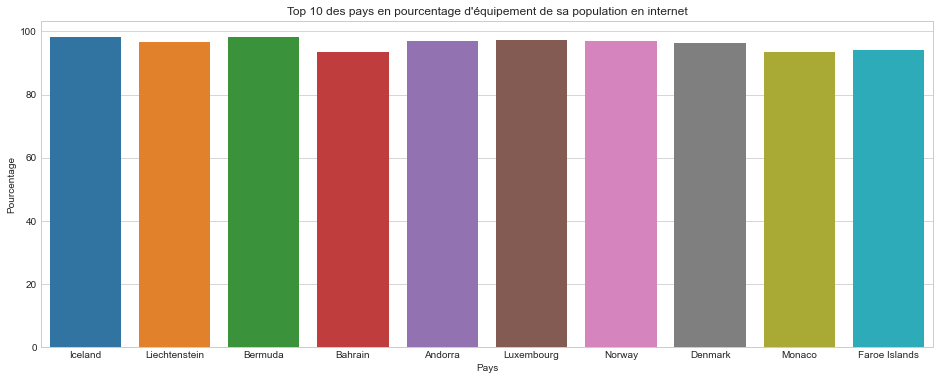

In [78]:
plt.figure(figsize=(16,6))
ax1=sns.barplot(x=Top10_Tech['Country Name'], y=Top10_Tech['2015'],)
ax1.set_title("Top 10 des pays en pourcentage d\'équipement de sa population en internet")
ax1.set_ylabel("Pourcentage")
ax1.set_xlabel("Pays")
plt.show()


#### *3.1.4. Moyenne, Médiane et Ecart-type par Région* 

In [79]:
Tech_Region = Tech_indicators_2012_2016.groupby(['Region']).agg((['mean','median','std']))
Tech_Region

2012                             2013  \
                                 mean     median        std       mean   
Region                                                                   
East Asia & Pacific         37.170616  33.742357  27.481515  39.810176   
Europe & Central Asia       64.549977  64.896010  21.943730  67.806487   
Latin America & Caribbean   43.083940  40.547900  17.302333  45.826714   
Middle East & North Africa  46.435057  48.700000  25.278648  50.496208   
North America               82.999768  83.000000   8.299652  84.166667   
South Asia                  14.619926  11.864680  10.822260  17.528750   
Sub-Saharan Africa          10.634086   6.106695  10.869535  12.875809   

                                                     2014                     \
                             median        std       mean  median        std   
Region                                                                         
East Asia & Pacific         35.2000  28.191942  42.959080  37.400  27.789296   
Europe & Central Asia       68.4529  21.355516  70.186824  71.590  20.160068   
Latin America & Caribbean   45.3000  17.185659  49.370537  50.000  17.964062   
Middle East & North Africa  51.3000  26.173703  54.367457  55.235  25.921000   
North America               85.8000  12.033426  85.640000  87.120  11.968826   
South Asia                  14.2000  12.367008  21.840000  18.220  13.426877   
Sub-Saharan Africa           9.0000  12.182097  15.295407  10.600  13.114740   

                                 2015                             2016  \
                                 mean     median        std       mean   
Region                                                                   
East Asia & Pacific         46.466484  42.500000  27.627675  49.742741   
Europe & Central Asia       72.488018  72.900000  19.038749  74.786072   
Latin America & Caribbean   53.097023  54.215766  18.136996  55.996939   
Middle East & North Africa  57.268647  58.769288  24.964536  59.841707   
North America               87.115937  88.470000  11.942416  88.005579   
South Asia                  25.561539  21.790809  15.487468  28.313673   
Sub-Saharan Africa          18.187042  16.500000  14.154121  20.312099   

                                                  
                               median        std  
Region                                            
East Asia & Pacific         46.500000  27.597251  
Europe & Central Asia       76.409085  18.225229  
Latin America & Caribbean   58.136494  18.057180  
Middle East & North Africa  61.740289  24.852444  
North America               89.840000  11.026673  
South Asia                  24.617963  16.024294  
Sub-Saharan Africa          18.000000  14.590605

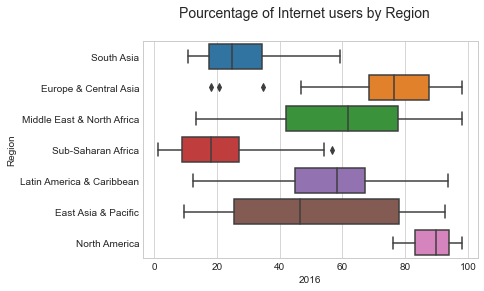

In [80]:
plt.figure()
sns.boxplot(data=Tech_indicators_2012_2016, x="2016", y="Region")
plt.suptitle("Pourcentage of Internet users by Region", size=14, y=1)
plt.show()

#### *3.1.5. Top 5 par Région* 

In [81]:
Tech_Region_Top5 = Tech_indicators_2012_2016.groupby(['Region']).agg('mean').sort_values(by=['2016'], ascending=False).head()

In [82]:
Tech_Region_Top5

,2012,2013,2014,2015,2016
Region,,,,,
North America,82.999768,84.166667,85.640000,87.115937,88.005579
Europe & Central Asia,64.549977,67.806487,70.186824,72.488018,74.786072
Middle East & North Africa,46.435057,50.496208,54.367457,57.268647,59.841707
Latin America & Caribbean,43.083940,45.826714,49.370537,53.097023,55.996939
East Asia & Pacific,37.170616,39.810176,42.959080,46.466484,49.742741


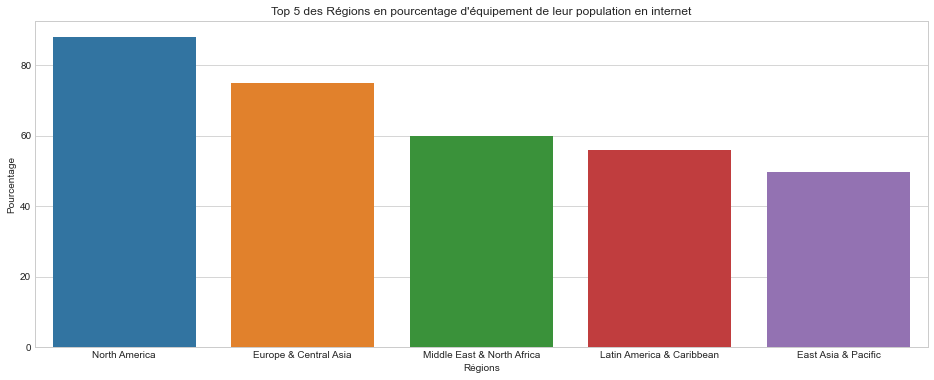

In [83]:
plt.figure(figsize=(16,6))
ax1=sns.barplot(x=Tech_Region_Top5.index, y=Tech_Region_Top5['2016'],)
ax1.set_title("Top 5 des Régions en pourcentage d\'équipement de leur population en internet")
ax1.set_ylabel("Pourcentage")
ax1.set_xlabel("Régions")
plt.show()

### *3.2. Exploration des indicateurs Démographique*

#### 3.2.1. Moyenne, Mediane et Ecart-type au niveau pays

In [84]:
total_pop = demographic_indicators[demographic_indicators['Indicator Code']=='SP.POP.1524.TO.UN']
total_pop_stat= total_pop.agg(['mean','median','std'])

In [85]:
total_pop_stat

,2011,2012,2013,2014,2015
mean,6.741725e+06,6.738950e+06,6.727552e+06,6.713254e+06,6.700539e+06
median,1.321838e+06,1.305029e+06,1.313021e+06,1.320960e+06,1.331040e+06
std,2.466990e+07,2.459055e+07,2.446424e+07,2.431782e+07,2.417073e+07


#### *3.2.2. Top 10 des pays les plus peuplés en nombre de populations agées de 15-24 ans*

In [86]:
Top10_Demo_total_pop=total_pop.sort_values(by=['2015'], ascending=False).head(10)
Top10_Demo_total_pop[['Country Name','2015']]

,Country Name,2015
317672,India,244120201.0
149082,China,197026759.0
746477,United States,45147517.0
321337,Indonesia,41819264.0
533907,Pakistan,39080811.0
519247,Nigeria,36659023.0
57457,Bangladesh,34400594.0
97772,Brazil,33595574.0
229712,Ethiopia,21074230.0
460607,Mexico,20336734.0


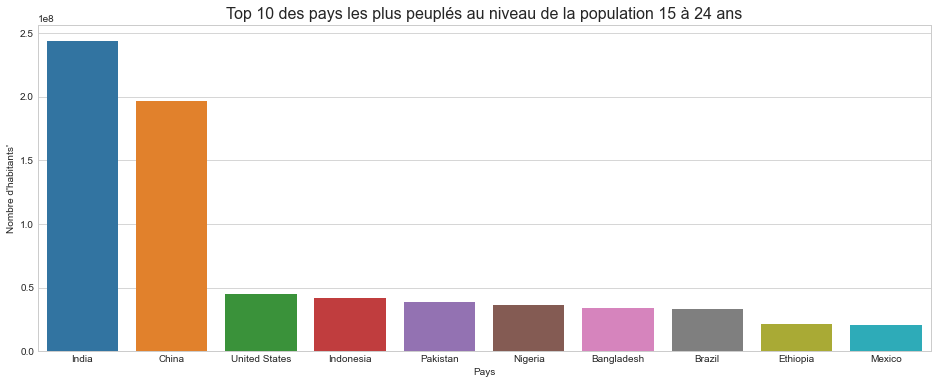

In [87]:
plt.figure(figsize=(16,6))
ax1=sns.barplot(x=Top10_Demo_total_pop['Country Name'], y=Top10_Demo_total_pop['2015'],)
ax1.set_title("Top 10 des pays les plus peuplés au niveau de la population 15 à 24 ans", size=16)
ax1.set_ylabel("Nombre d\'habitants'")
ax1.set_xlabel("Pays")
plt.show()

#### *3.2.4. Moyenne, Médiane et Ecart-type par Région* 

In [88]:
Demo_Region_stat = total_pop.groupby(['Region']).agg((['mean','median','std']))
Demo_Region_stat

2011                            \
                                    mean      median           std   
Region                                                               
East Asia & Pacific         1.348818e+07   1129457.0  4.231498e+07   
Europe & Central Asia       2.578908e+06   1135417.0  3.808621e+06   
Latin America & Caribbean   3.397645e+06   1321838.0  6.842753e+06   
Middle East & North Africa  3.745712e+06   1215526.5  4.802827e+06   
North America               2.489555e+07  24895549.5  2.885079e+07   
South Asia                  4.080780e+07   6341681.0  8.094339e+07   
Sub-Saharan Africa          3.933730e+06   2208390.5  5.895584e+06   

                                    2012                            \
                                    mean      median           std   
Region                                                               
East Asia & Pacific         1.331234e+07   1147717.0  4.151241e+07   
Europe & Central Asia       2.518938e+06   1122245.5  3.681421e+06   
Latin America & Caribbean   3.408307e+06   1333409.0  6.838840e+06   
Middle East & North Africa  3.724087e+06   1229002.5  4.714623e+06   
North America               2.491137e+07  24911370.5  2.889482e+07   
South Asia                  4.116542e+07   6529843.5  8.167346e+07   
Sub-Saharan Africa          4.021625e+06   2232522.5  6.036427e+06   

                                    2013                            \
                                    mean      median           std   
Region                                                               
East Asia & Pacific         1.310589e+07   1165924.5  4.057549e+07   
Europe & Central Asia       2.457663e+06   1103635.5  3.562827e+06   
Latin America & Caribbean   3.418514e+06   1344145.0  6.844177e+06   
Middle East & North Africa  3.697828e+06   1241921.5  4.622317e+06   
North America               2.488006e+07  24880062.0  2.888864e+07   
South Asia                  4.145729e+07   6710276.0  8.228577e+07   
Sub-Saharan Africa          4.110375e+06   2248211.5  6.177299e+06   

                                    2014                            \
                                    mean      median           std   
Region                                                               
East Asia & Pacific         1.289226e+07   1180878.5  3.961166e+07   
Europe & Central Asia       2.399667e+06   1080776.5  3.460758e+06   
Latin America & Caribbean   3.427954e+06   1354149.0  6.857149e+06   
Middle East & North Africa  3.671774e+06   1255709.5  4.537460e+06   
North America               2.482369e+07  24823692.5  2.886007e+07   
South Asia                  4.168687e+07   6878784.0  8.277708e+07   
Sub-Saharan Africa          4.200971e+06   2268167.5  6.318677e+06   

                                    2015                            
                                    mean      median           std  
Region                                                              
East Asia & Pacific         1.268931e+07   1175232.5  3.870231e+07  
Europe & Central Asia       2.348418e+06   1049138.5  3.379251e+06  
Latin America & Caribbean   3.436383e+06   1363506.0  6.876221e+06  
Middle East & North Africa  3.649822e+06   1271319.5  4.468320e+06  
North America               2.476051e+07  24760514.0  2.883158e+07  
South Asia                  4.185906e+07   7032757.5  8.314867e+07  
Sub-Saharan Africa          4.294117e+06   2296726.5  6.460906e+06

#### *3.2.5. Classement de la population 15-24 ans par Région* 

In [103]:
Demo_rank_by_region=total_pop.groupby(['Region']).agg('mean').sort_values(by=['2015'], ascending=False)
Demo_rank_by_region.head()

,2011,2012,2013,2014,2015
Region,,,,,
South Asia,4.080780e+07,4.116542e+07,4.145729e+07,4.168687e+07,4.185906e+07
North America,2.489555e+07,2.491137e+07,2.488006e+07,2.482369e+07,2.476051e+07
East Asia & Pacific,1.348818e+07,1.331234e+07,1.310589e+07,1.289226e+07,1.268931e+07
Sub-Saharan Africa,3.933730e+06,4.021625e+06,4.110375e+06,4.200971e+06,4.294117e+06
Middle East & North Africa,3.745712e+06,3.724087e+06,3.697828e+06,3.671774e+06,3.649822e+06


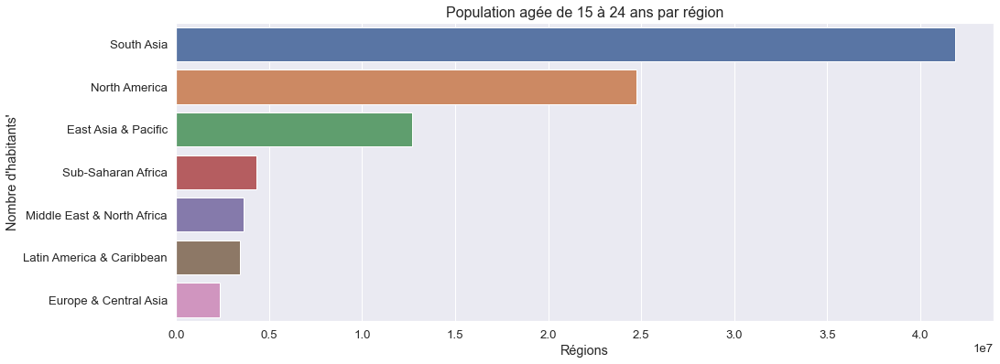

In [104]:
plt.figure(figsize=(16,6))
ax1=sns.barplot(y=Demo_rank_by_region.index, x=Demo_rank_by_region['2015'],orient='h')
ax1.set_title("Population agée de 15 à 24 ans par région", size=16)
ax1.set_ylabel("Nombre d\'habitants'")
ax1.set_xlabel("Régions")
plt.show()

#### *3.2.6. Classement de la population 15-24 ans par Région et niveaux de revenus* 

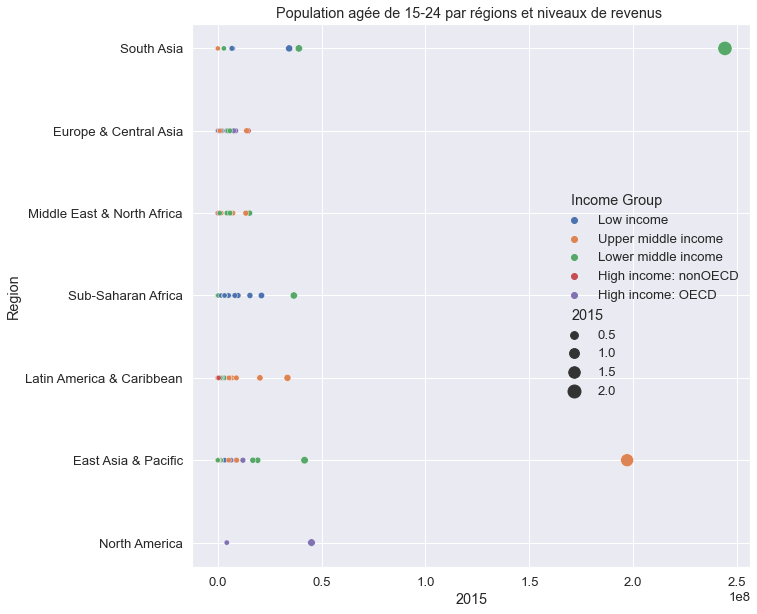

In [90]:
sns.set(font_scale=1.2)
plt.figure(figsize=(10,10))
sns.scatterplot(data=total_pop, 
                y="Region", 
                x="2015", 
                size='2015',
                hue="Income Group", 
                sizes=(25,200))
plt.title("Population agée de 15-24 par régions et niveaux de revenus ")
plt.show()

### *3.3. Exploration des indicateurs d'Employabilité*

In [91]:
# SL.TLF.ADVN.ZS : Labor force with advanced education (% of total)
# SL.TLF.INTM.ZS : Labor force with intermediate education (% of total)

# L'objectif est de comprendre si la population éduquée accède à l'emploi local

#### 3.3.1. Moyenne, Mediane et Ecart-type au niveau pays 

#### *Pour l'indicateur "Actifs avec éducation Supérieure"*

In [92]:
Labor_advanced_education = employability_indicators[employability_indicators['Indicator Code']=='SL.TLF.ADVN.ZS']
Labor_advanced_education_stat= Labor_advanced_education.agg(['mean','median','std'])

Labor_advanced_education_stat


,2011,2012,2013,2014,2015
mean,78.568477,78.480455,78.371091,77.386296,78.445704
median,78.750000,78.770000,78.200001,77.689999,77.695000
std,4.566418,4.612760,4.401170,7.177023,4.354504


#### *Pour l'indicateur "Actifs avec éducation Intermédiaire"*

In [93]:
Labor_intermediate_education = employability_indicators[employability_indicators['Indicator Code']=='SL.TLF.INTM.ZS']
Labor_intermediate_education_stat= Labor_intermediate_education.agg(['mean','median','std'])

Labor_intermediate_education_stat

,2011,2012,2013,2014,2015
mean,66.328023,66.205864,65.898978,66.384091,65.702136
median,65.195000,65.189999,65.110500,65.529999,64.554996
std,5.364414,5.157847,5.288492,5.937942,5.459869


In [94]:
len(employability_indicators['Country Name'])

88

#### *3.2.2. Top 10 des pays pour l'emploi d'actifs avec un niveau d'éducation Intermédaire et Supérieure*

#### *Classement pour l'indicateur "Actifs avec éducation Supérieure"*

In [95]:
Top10_Employability_advanced_education=Labor_advanced_education.sort_values(by=['2015'], ascending=False).head(10)
Top10_Employability_advanced_education[['Country Name','2015']]

,Country Name,2015
312901,Iceland,91.709999
525471,Norway,85.010002
444841,Malta,83.830002
184626,Cyprus,83.809998
741706,United Kingdom,83.769997
675736,Sweden,83.389999
389866,Latvia,83.220001
96666,Brazil,82.439003
411856,Lithuania,82.370003
562121,Portugal,82.199997


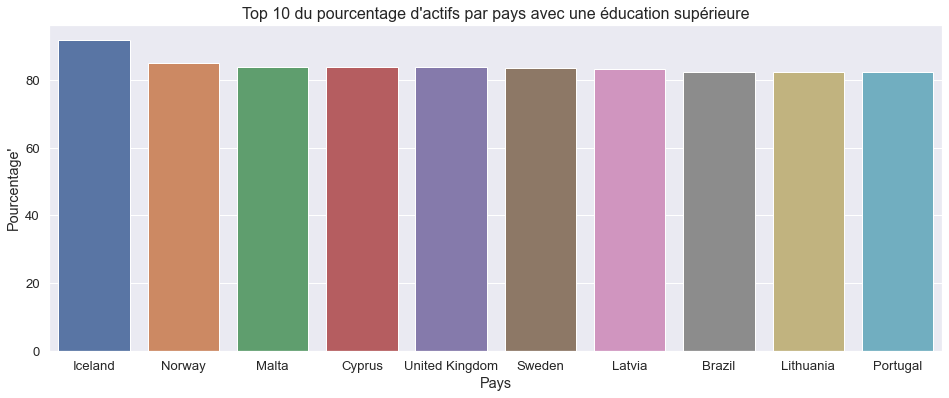

In [96]:
plt.figure(figsize=(16,6))
ax1=sns.barplot(x=Top10_Employability_advanced_education['Country Name'], y=Top10_Employability_advanced_education['2015'],)
ax1.set_title("Top 10 du pourcentage d\'actifs par pays avec une éducation supérieure", size=16)
ax1.set_ylabel("Pourcentage'")
ax1.set_xlabel("Pays")
plt.show()

#### *Classement pour l'indicateur "Actifs avec éducation Intermédiaire"*

In [97]:
Top10_Employability_intermediate_education=Labor_intermediate_education.sort_values(by=['2015'], ascending=False).head(10)
Top10_Employability_intermediate_education[['Country Name','2015']]

,Country Name,2015
312907,Iceland,84.739998
675742,Sweden,76.970001
562127,Portugal,74.660004
96672,Brazil,74.367996
741712,United Kingdom,74.199997
224947,Estonia,71.779999
525477,Norway,71.010002
499822,Netherlands,69.989998
389872,Latvia,68.540001
642757,Spain,68.410004


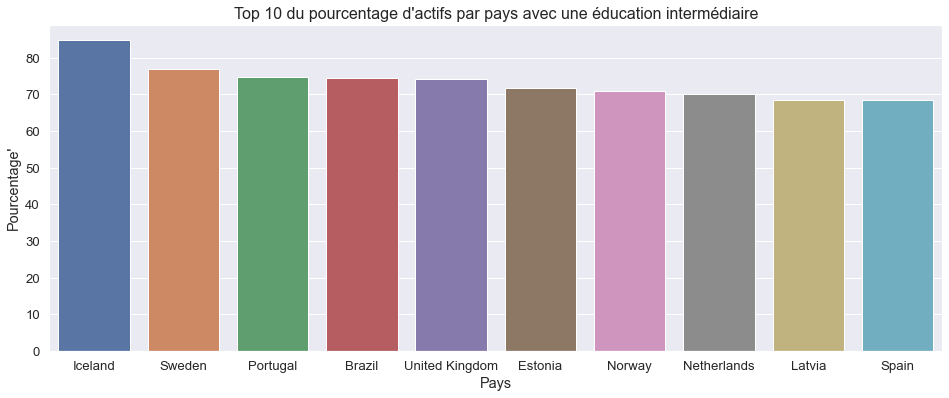

In [98]:
plt.figure(figsize=(16,6))
ax1=sns.barplot(x=Top10_Employability_intermediate_education['Country Name'], y=Top10_Employability_intermediate_education['2015'],)
ax1.set_title("Top 10 du pourcentage d\'actifs par pays avec une éducation intermédiaire", size=16)
ax1.set_ylabel("Pourcentage'")
ax1.set_xlabel("Pays")
plt.show()